In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [56]:
# load file into dataframe
data = pd.read_csv('stocks_combined_scaled.csv', index_col=0)

data.head()

,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,name_price_attention,volatility,industry
0,2014-01-02,10107,MSFT,-0.999221,1.117934,-0.006683,-0.992613,-1.004799,-0.997672,-0.998750,0.138220,-0.419196,-0.712226,-0.494860,Technology
1,2014-01-03,10107,MSFT,-1.001527,1.148820,-0.006728,-0.994243,-1.009502,-0.999057,-1.001888,0.132557,-0.421781,-0.816796,-0.438358,Technology
2,2014-01-06,10107,MSFT,-1.008721,1.870624,-0.021133,-0.997232,-1.014112,-1.002286,-1.005672,0.114890,-1.249333,-0.771331,-0.410107,Technology
3,2014-01-07,10107,MSFT,-1.006139,1.417816,0.007750,-1.000854,-1.013171,-1.007130,-1.007056,0.121232,0.409965,-0.839528,-0.498392,Technology
4,2014-01-08,10107,MSFT,-1.012134,2.840056,-0.017852,-1.004023,-1.019098,-1.010129,-1.011579,0.106510,-1.060843,-0.807703,-0.448952,Technology


In [57]:
# summary statistics
data.describe()

,permno,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,name_price_attention,volatility
count,70448.000000,7.044800e+04,7.044800e+04,70448.000000,7.044800e+04,7.044800e+04,7.044800e+04,70448.000000,7.044800e+04,7.044800e+04,7.044800e+04,7.044800e+04
mean,42556.107143,-2.969336e-16,1.936523e-17,0.000614,9.037110e-17,-1.291016e-16,-1.032813e-16,0.000000,-2.582031e-17,-2.218933e-17,-2.259277e-17,3.873047e-17
std,28269.163826,1.000007e+00,1.000007e+00,0.017407,1.000007e+00,1.000007e+00,1.000007e+00,1.000007,1.000007e+00,1.000007e+00,1.000007e+00,1.000007e+00
min,10107.000000,-1.145044e+00,-6.688350e-01,-0.238484,-1.135511e+00,-1.153717e+00,-1.145396e+00,-1.144624,-6.566479e-01,-1.373592e+01,-9.168190e-01,-5.319401e-01
25%,17270.500000,-5.986486e-01,-4.895764e-01,-0.006783,-5.956138e-01,-6.012235e-01,-5.987912e-01,-0.598519,-4.114707e-01,-4.249406e-01,-9.168190e-01,-3.641986e-01
50%,34926.000000,-1.803673e-01,-3.193574e-01,0.000619,-1.804125e-01,-1.802450e-01,-1.806257e-01,-0.181005,-2.439655e-01,2.964425e-04,-2.881008e-01,-2.176436e-01
75%,61063.000000,2.846076e-01,8.092260e-02,0.008153,2.801576e-01,2.888051e-01,2.843435e-01,0.284456,-2.598057e-02,4.331168e-01,5.016940e-01,6.133531e-02
max,93436.000000,1.930693e+01,3.598990e+01,0.260449,1.966413e+01,1.921553e+01,1.983467e+01,19.447214,7.704748e+00,1.492726e+01,5.578204e+00,5.663966e+01


In [58]:
#adding the dummy variable for covid. 

split_date = '2020-01-01'
data['Post-covid'] = (data['date'] >= split_date).astype(int)
#data['Post-covid'] = (df_lag.index >= split_date).astype(int)

data.head()

,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,name_price_attention,volatility,industry,Post-covid
0,2014-01-02,10107,MSFT,-0.999221,1.117934,-0.006683,-0.992613,-1.004799,-0.997672,-0.998750,0.138220,-0.419196,-0.712226,-0.494860,Technology,0
1,2014-01-03,10107,MSFT,-1.001527,1.148820,-0.006728,-0.994243,-1.009502,-0.999057,-1.001888,0.132557,-0.421781,-0.816796,-0.438358,Technology,0
2,2014-01-06,10107,MSFT,-1.008721,1.870624,-0.021133,-0.997232,-1.014112,-1.002286,-1.005672,0.114890,-1.249333,-0.771331,-0.410107,Technology,0
3,2014-01-07,10107,MSFT,-1.006139,1.417816,0.007750,-1.000854,-1.013171,-1.007130,-1.007056,0.121232,0.409965,-0.839528,-0.498392,Technology,0
4,2014-01-08,10107,MSFT,-1.012134,2.840056,-0.017852,-1.004023,-1.019098,-1.010129,-1.011579,0.106510,-1.060843,-0.807703,-0.448952,Technology,0


# Visualizations

1. Time series of price and attention proxies
    * Time series for each stock 
    * Time series pre and post covid
    * Time series per industry
    * Quarterly and Monthly look
2. Distributions of dependend and independent variables 
3. Scatter plots with the Relationships 

### 1. Time Series Analysis

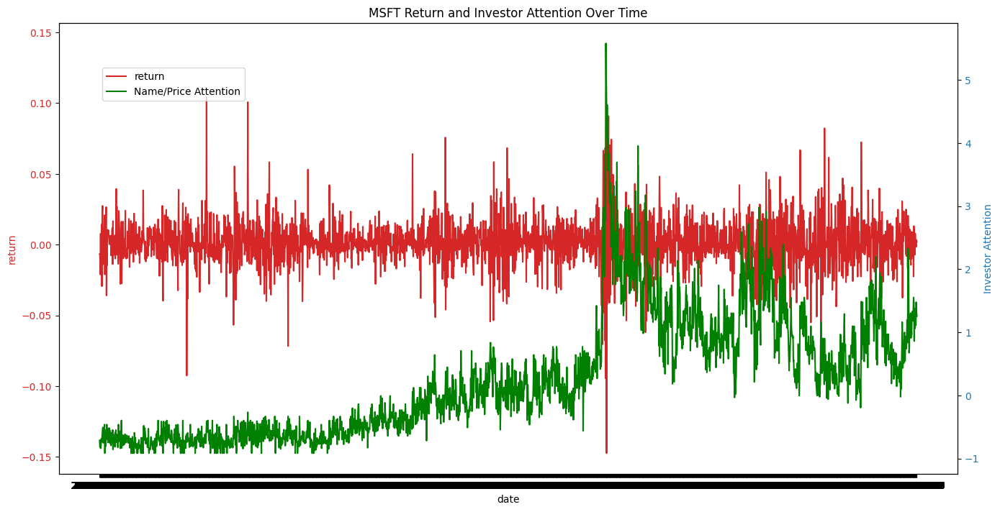

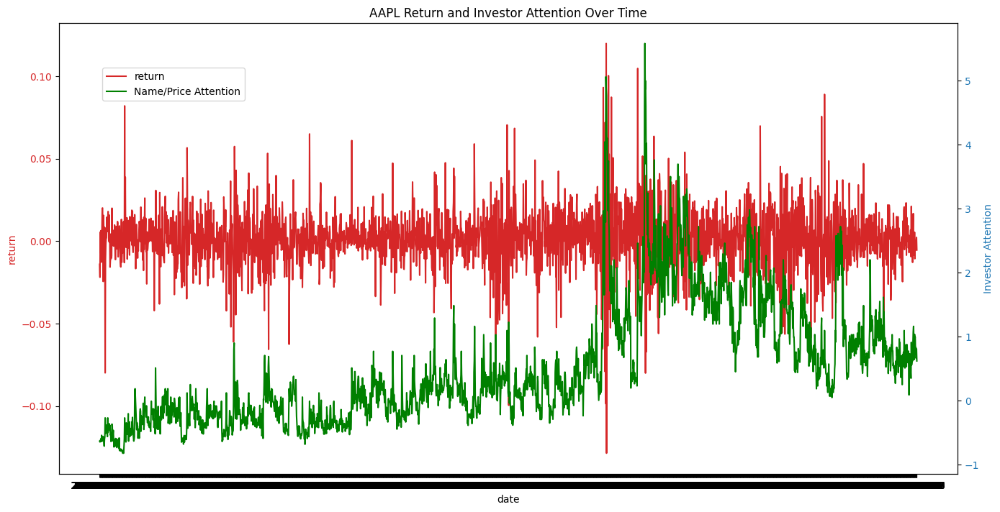

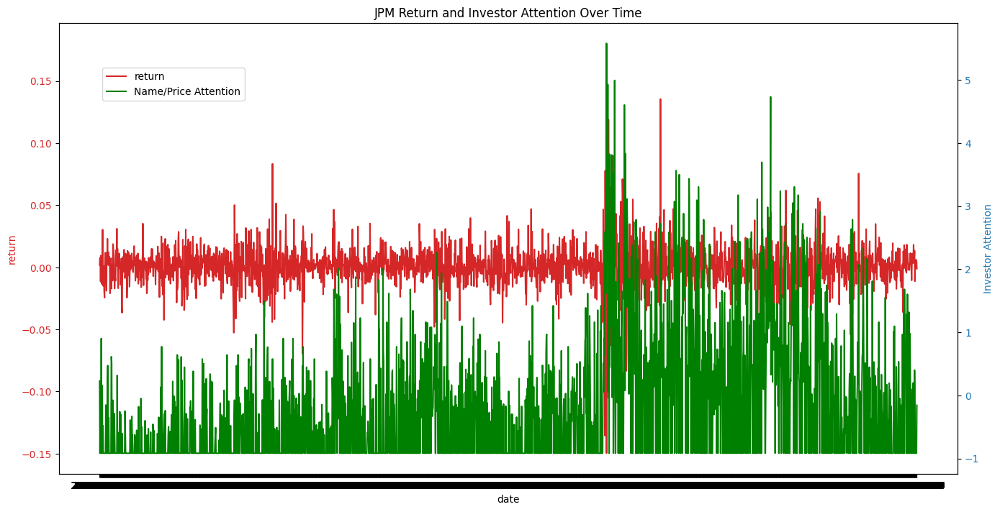

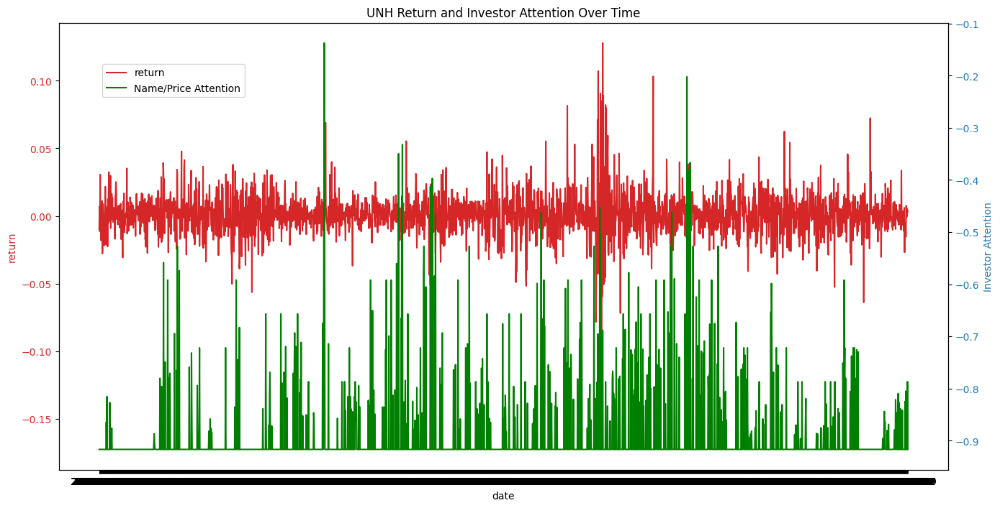

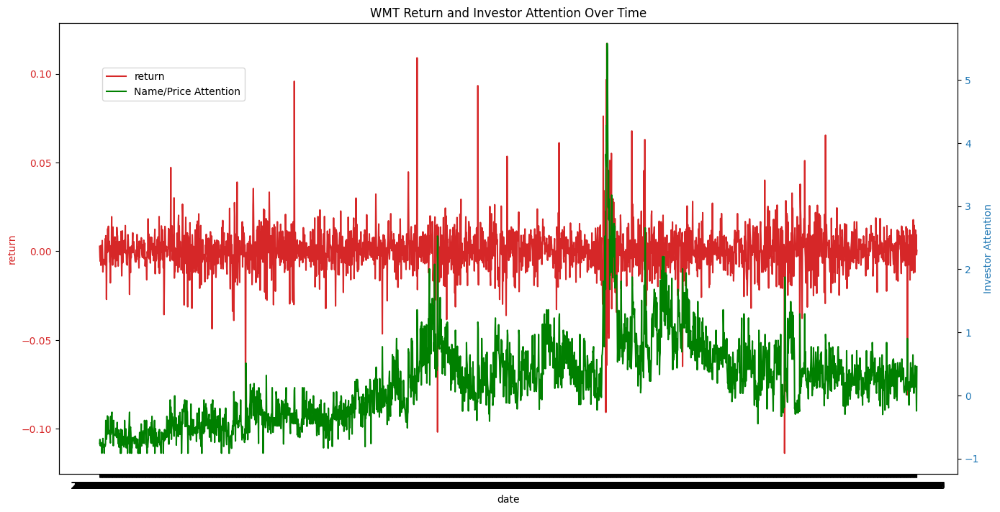

...

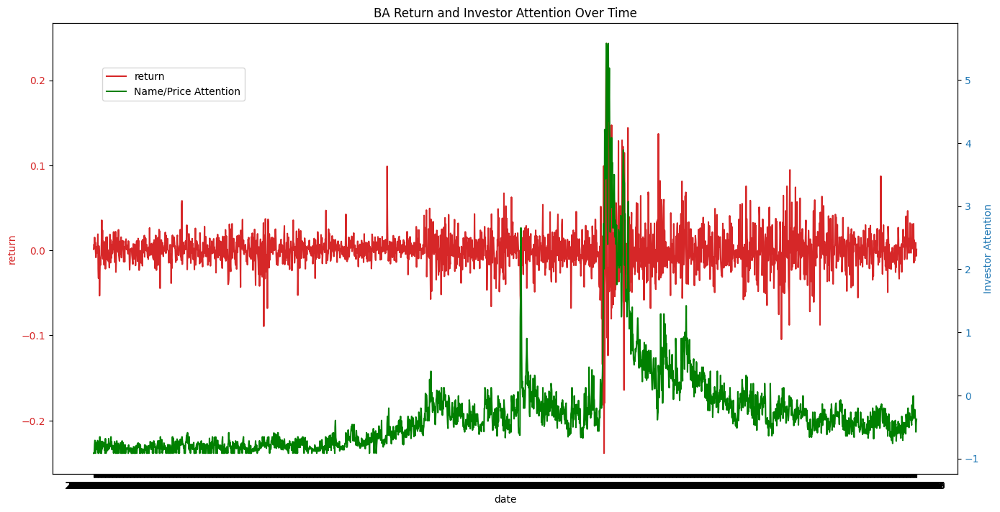

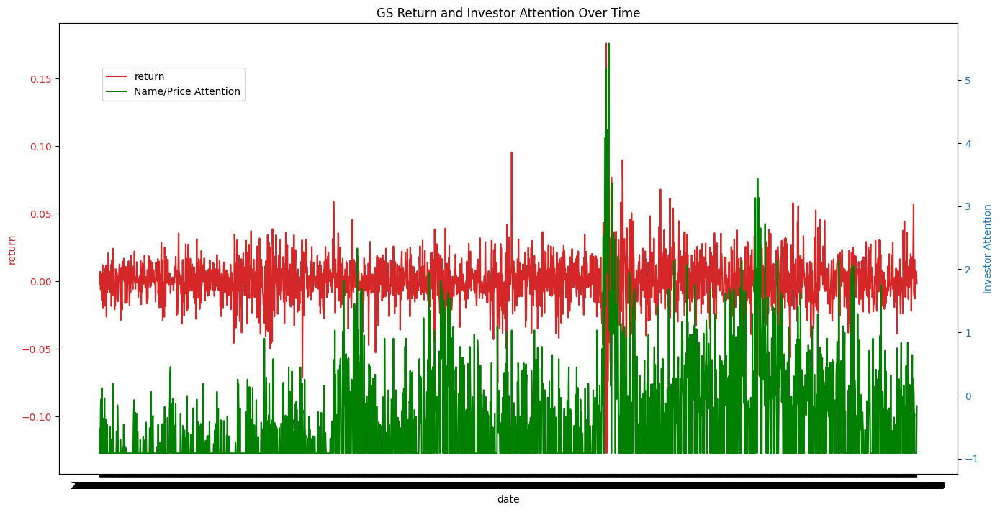

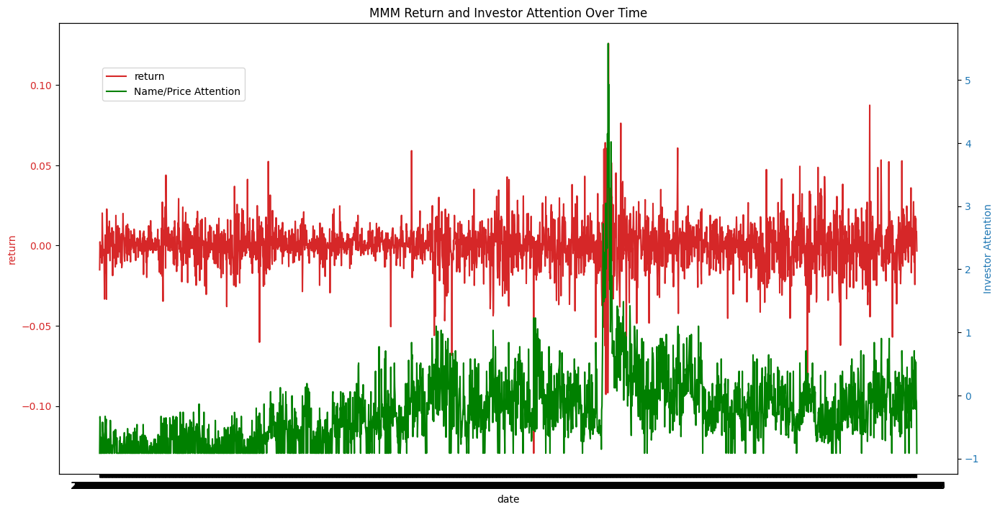

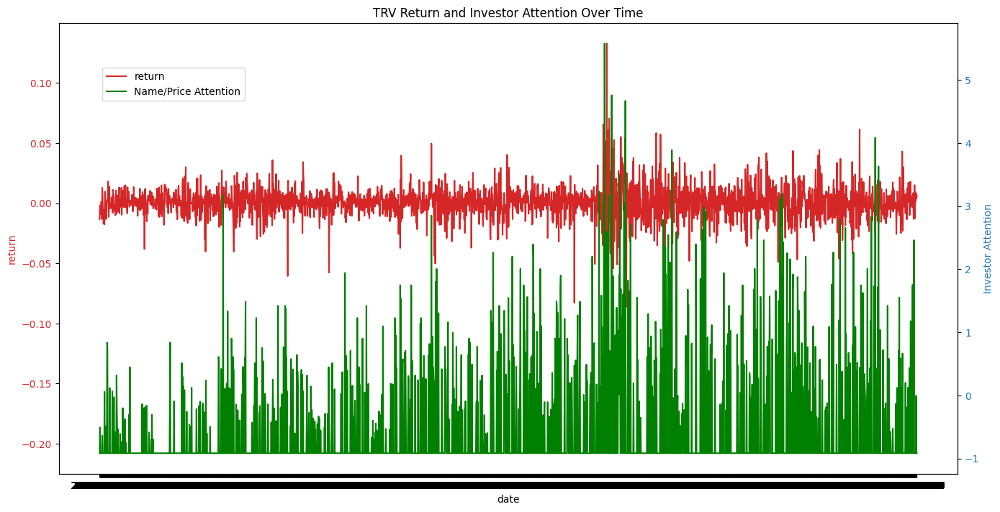

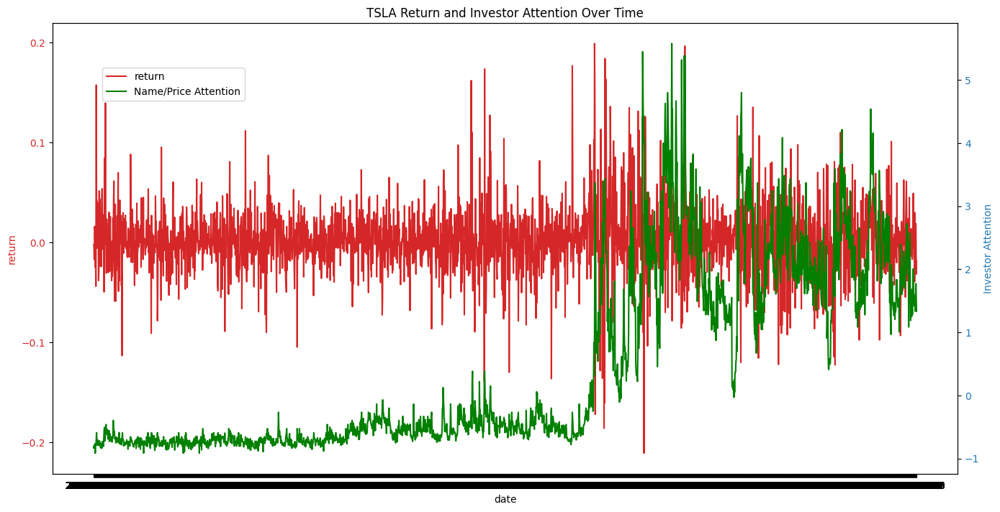

In [9]:
# loop that creates a time series plot for each stock containing price, ticker_attention, and name_price_attention

stocks = data['ticker'].unique()

for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax1 = plt.subplots(figsize=(14, 7))

    color = 'tab:red'
    ax1.set_xlabel('date')
    ax1.set_ylabel('return', color=color)
    ax1.plot(stock_data['date'], stock_data['return'], color=color, label='return')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('Investor Attention', color=color)  # we already handled the x-label with ax1
    ax2.plot(stock_data['date'], stock_data['name_price_attention'], color='green', label='Name/Price Attention')
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title(f'{stock} Return and Investor Attention Over Time')
    fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9))
    plt.show()

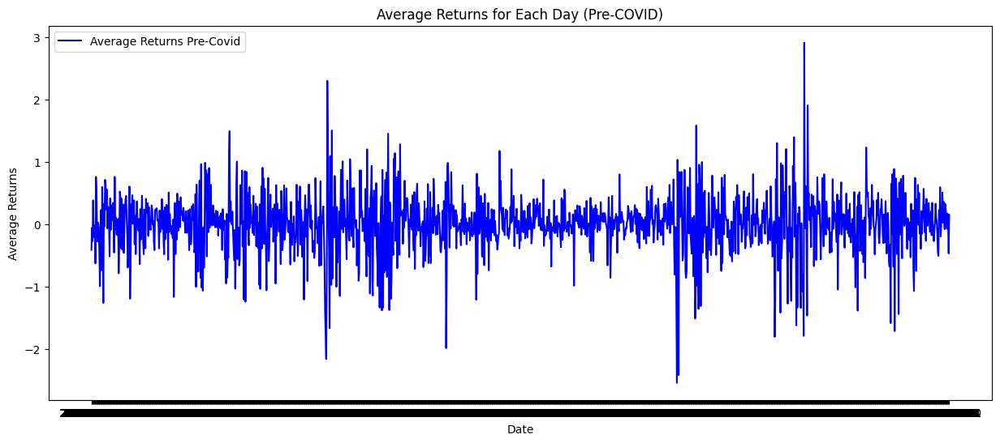

In [65]:
# Looking at the impact of Covid: Average Returns per day Pre-covid 

average_returns_pre_covid = data[data['Post-covid'] == 0].groupby('date')['pct_return'].mean()

# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns Pre-Covid',color='blue')
plt.title('Average Returns for Each Day (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()

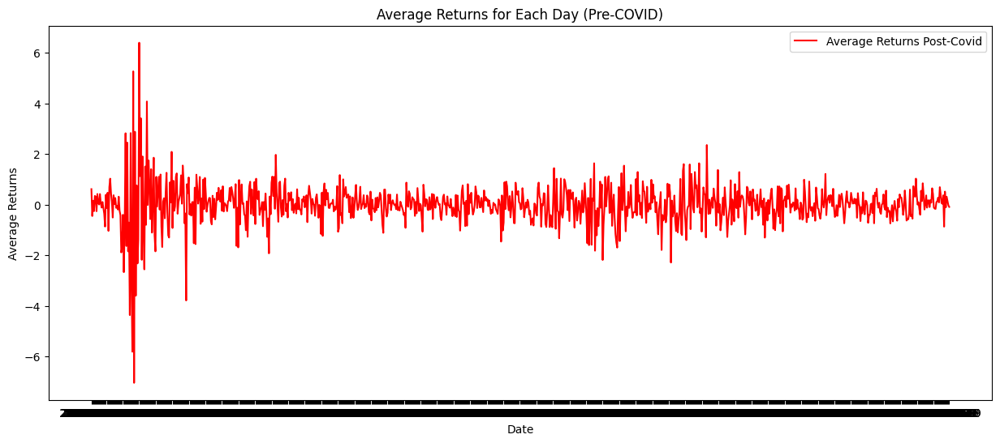

In [61]:
# Looking at the impact of Covid: Average Returns per day Pre-covid 
average_returns_post_covid = data[data['Post-covid'] == 1].groupby('date')['pct_return'].mean()

# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns Post-Covid',color='red')
plt.title('Average Returns for Each Day (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()

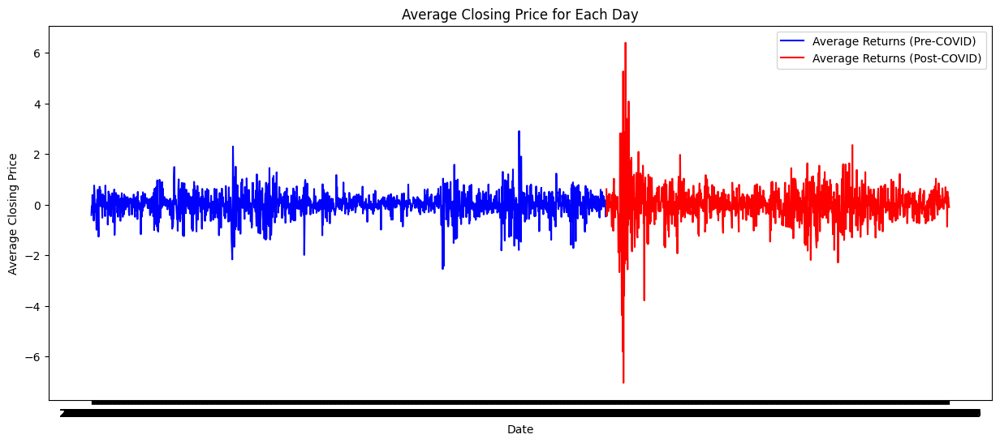

In [64]:
#Putting both together to see the on the same scale
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns (Pre-COVID)', color='blue')
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns (Post-COVID)', color='red')
plt.title('Average Closing Price for Each Day')
plt.xlabel('Date')
plt.ylabel('Average Closing Price')
plt.legend()
plt.show()


# Industry related visualizations

1. Time series of returns for all industries
2. Time series of returns for each industry

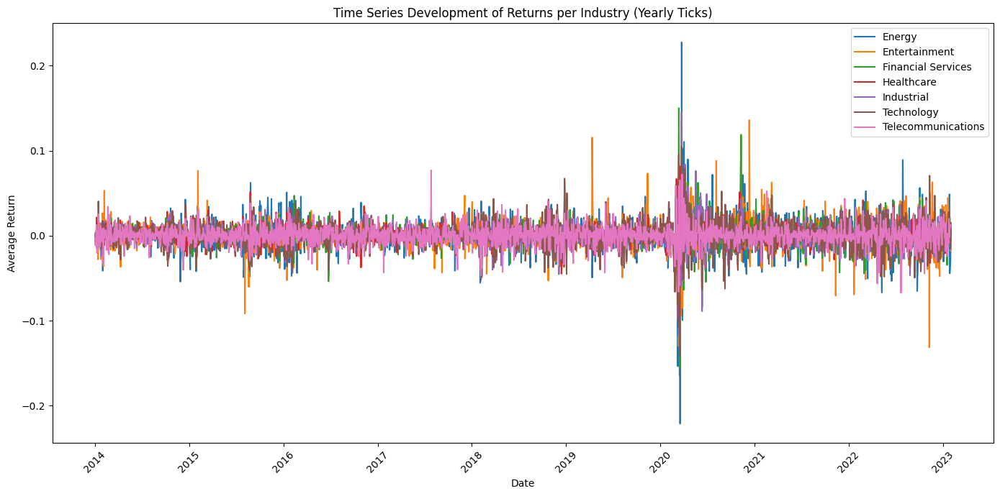

In [29]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Plotting with adjusted date ticks
plt.figure(figsize=(14, 7))
for industry in industry_returns_pivot.columns:
    plt.plot(industry_returns_pivot.index, industry_returns_pivot[industry], label=industry)

plt.title('Time Series Development of Returns per Industry (Yearly Ticks)')
plt.xlabel('Date')
plt.ylabel('Average Return')
plt.legend()

# Setting x-axis to only show the first occurrence of each year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



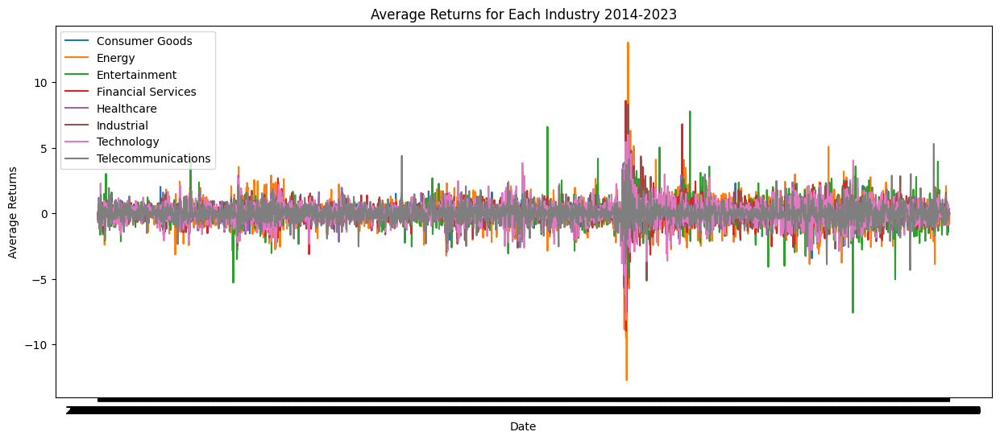

In [48]:
average_returns_by_industry = data.groupby(['industry', 'date'])['pct_return'].mean()
industries = average_returns_by_industry.index.get_level_values('industry').unique()

# Plotting
plt.figure(figsize=(15, 6))
for industry in industries:
    industry_data = average_returns_by_industry.loc[industry]
    plt.plot(industry_data.index, industry_data, label=industry)

plt.title('Average Returns for Each Industry 2014-2023')
plt.xlabel('Date')
plt.ylabel('Average Returns')
plt.legend()
plt.show()

In [49]:
average_returns_by_industry = average_returns_by_industry.reset_index()
average_returns_by_industry['date'] = pd.to_datetime(average_returns_by_industry['date'])

average_returns_by_industry.dtypes

industry              object
date          datetime64[ns]
pct_return           float64
dtype: object

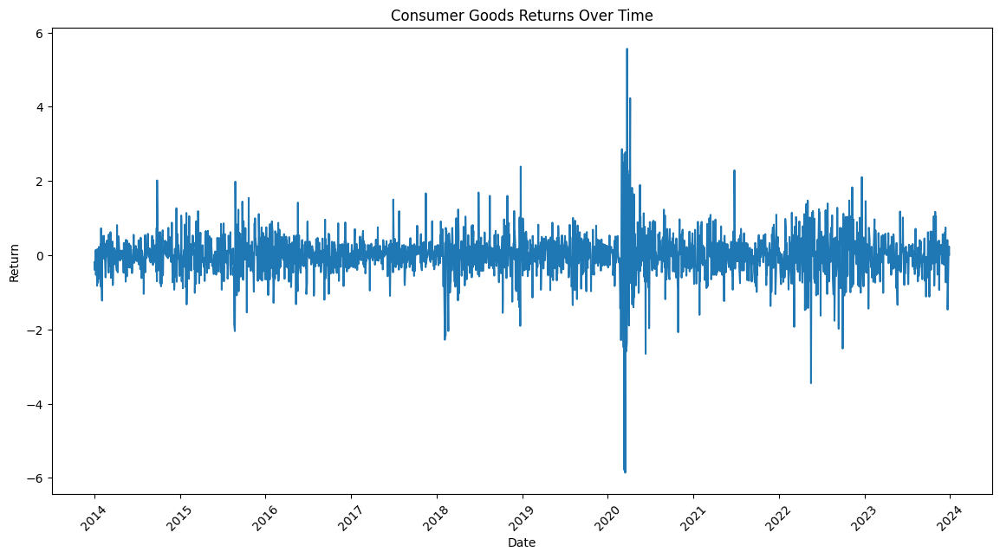

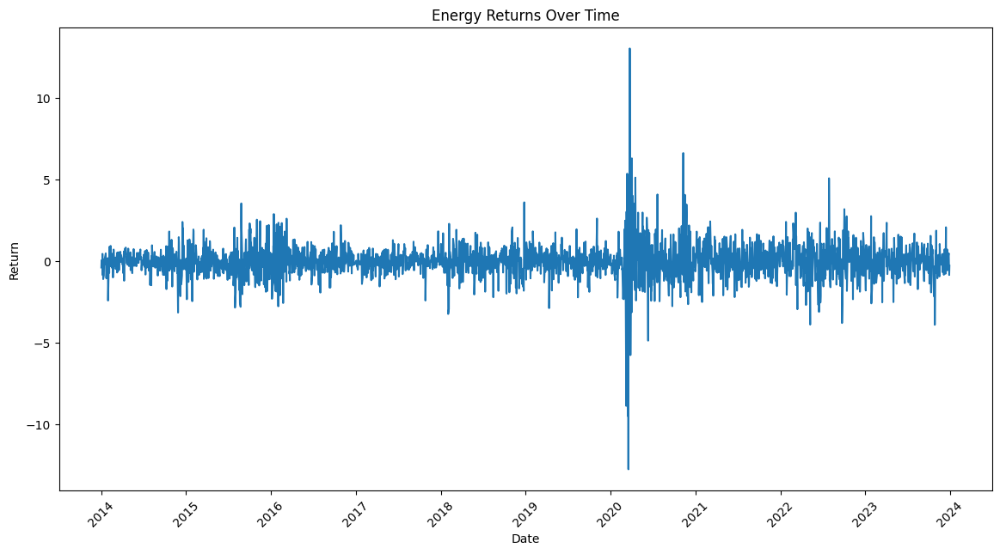

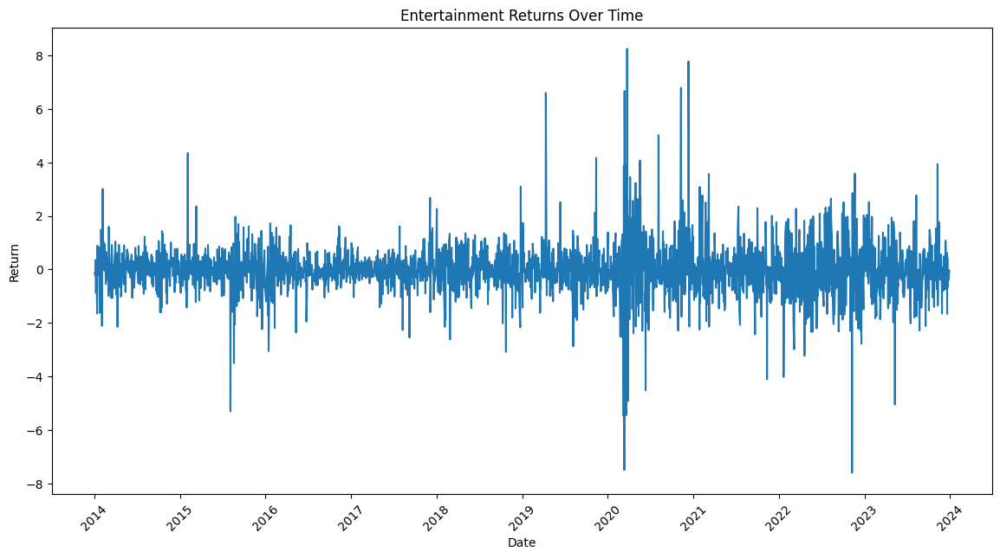

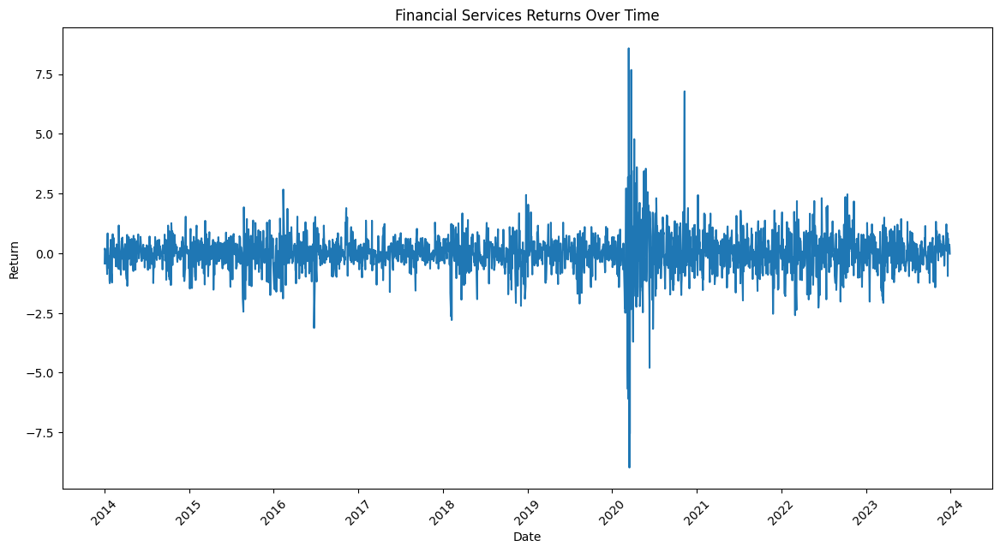

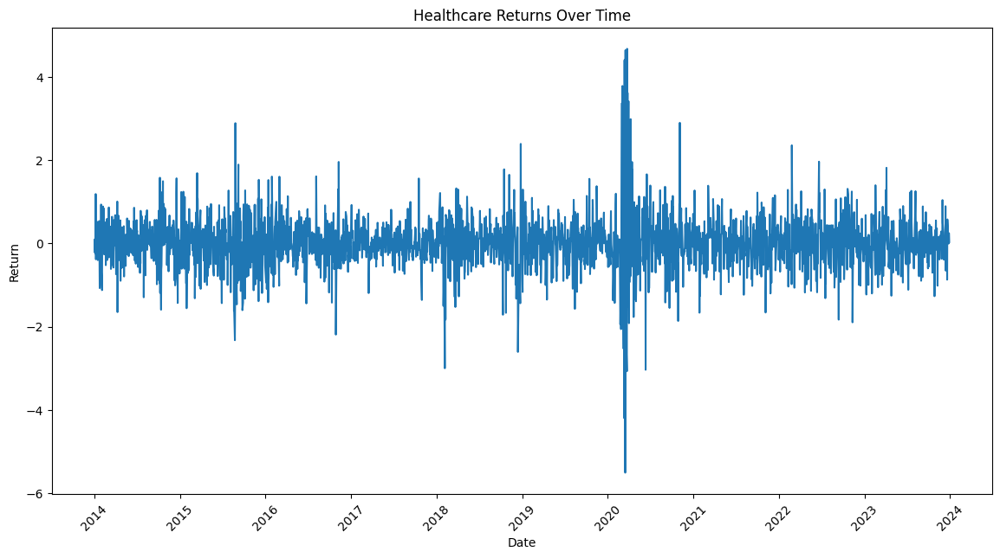

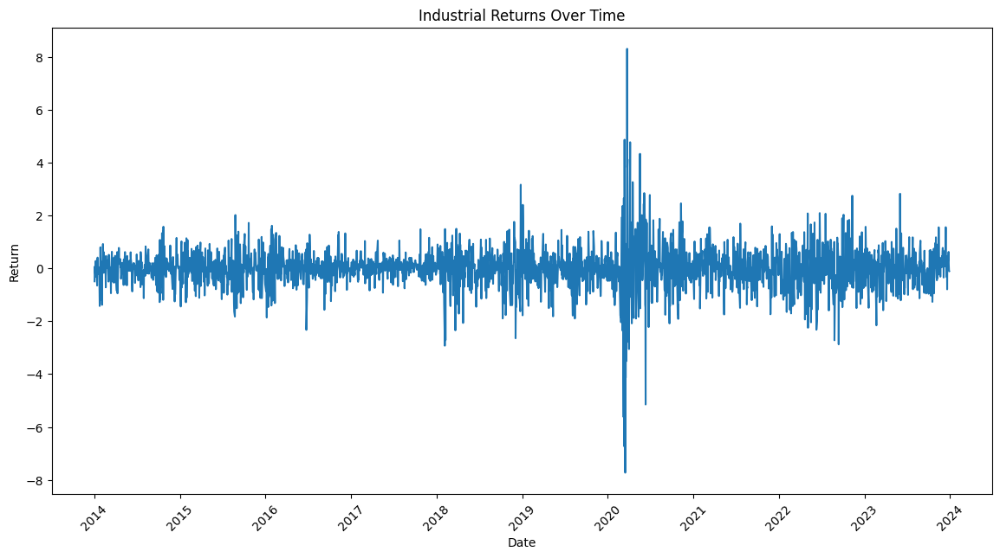

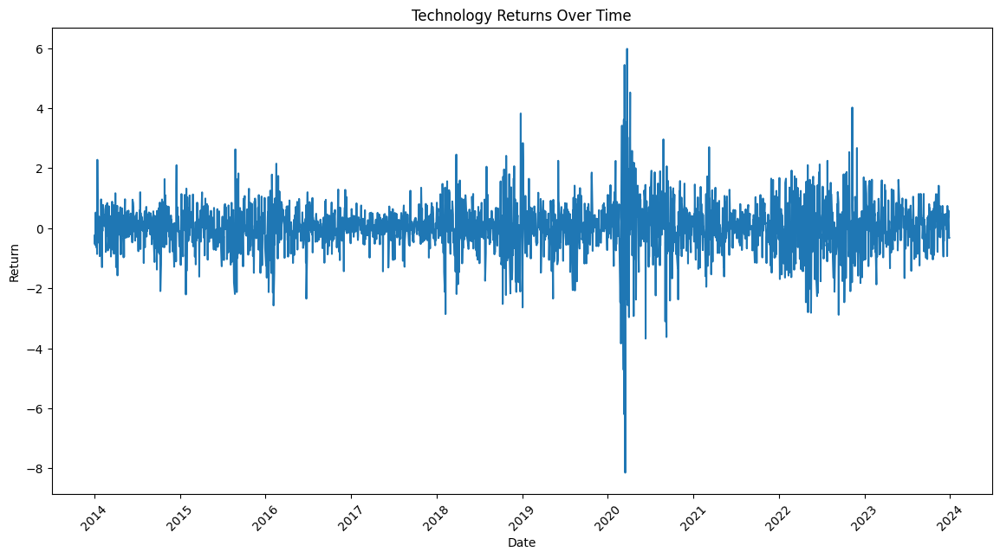

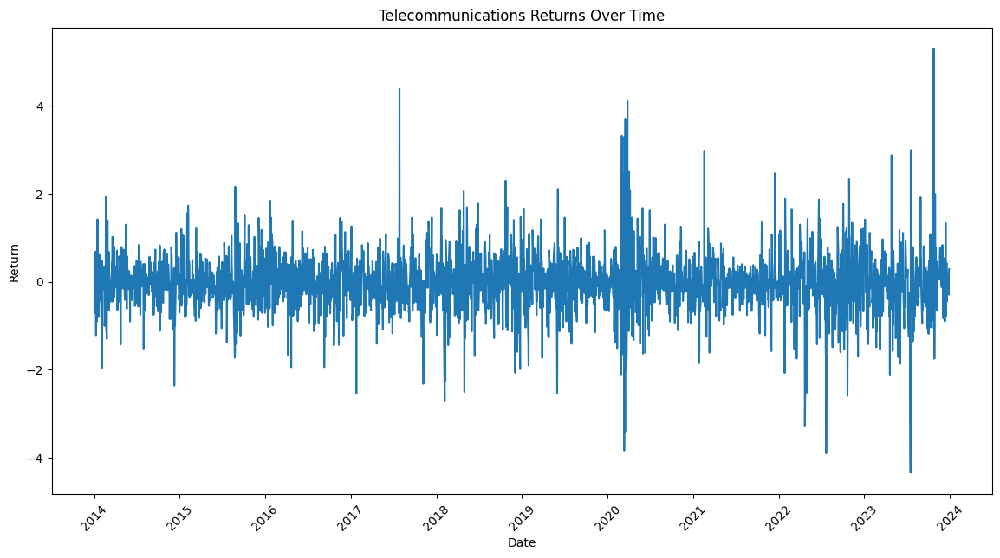

In [51]:
import matplotlib.pyplot as plt

# Assuming you have a list of unique industries stored in `industries`
for industry in industries:
    industry_data = average_returns_by_industry[average_returns_by_industry['industry'] == industry]
    plt.figure(figsize=(14, 7))
    plt.plot(industry_data['date'], industry_data['pct_return'])
    plt.title(f'{industry} Returns Over Time')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.xticks(rotation=45)
    plt.show()


In [81]:
#Quarterly Look

temp = data.copy()
temp['date'] = pd.to_datetime(temp['date'])

temp.set_index('date', inplace=True)
quarterly_values = pd.DataFrame()

quarterly_values['quarterly_returns']= temp.groupby(['ticker', 'industry'])['pct_return'].resample('QS').mean()
quarterly_values['quarterly_attention']= temp.groupby(['ticker', 'industry'])['name_price_attention'].resample('QS').mean()


quarterly_values.tail(10)

quarterly_returns  quarterly_attention
ticker industry       date                                              
WMT    Consumer Goods 2021-07-01          -0.041113             0.575413
                      2021-10-01           0.005417             0.473228
                      2022-01-01          -0.000779             0.309567
                      2022-04-01          -0.205682             0.608390
                      2022-07-01           0.035449             0.228720
                      2022-10-01           0.055283             0.382577
                      2023-01-01           0.007775             0.254946
                      2023-04-01           0.028945             0.298442
                      2023-07-01          -0.014568             0.249254
                      2023-10-01          -0.039758             0.262760

In [82]:
quarterly_values.reset_index(inplace=True)


split_date = '2020-01-01'


quarterly_values['Post-covid'] = (quarterly_values['date'] >= split_date).astype(int)
#quarterly_values['Post-covid'] = (quarterly_values['date']  >= split_date).astype(int)

quarterly_values


,ticker,industry,date,quarterly_returns,quarterly_attention,Post-covid
0,AAPL,Technology,2014-01-01,-0.065025,-0.559508,0
1,AAPL,Technology,2014-04-01,0.150962,-0.505674,0
2,AAPL,Technology,2014-07-01,0.046283,-0.256316,0
3,AAPL,Technology,2014-10-01,0.055415,-0.138228,0
4,AAPL,Technology,2015-01-01,0.089938,-0.295288,0
...,...,...,...,...,...,...
1075,WMT,Consumer Goods,2022-10-01,0.055283,0.382577,1
1076,WMT,Consumer Goods,2023-01-01,0.007775,0.254946,1
1077,WMT,Consumer Goods,2023-04-01,0.028945,0.298442,1
1078,WMT,Consumer Goods,2023-07-01,-0.014568,0.249254,1


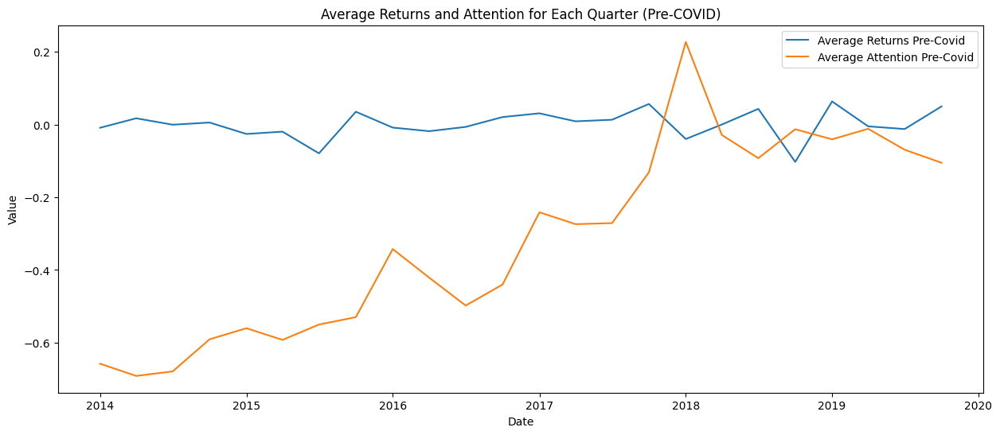

In [93]:
#Quarterly Visualizations 
average_returns_pre_covid = quarterly_values[quarterly_values['Post-covid'] == 0].groupby('date')['quarterly_returns'].mean()
average_attention_pre_covid = quarterly_values[quarterly_values['Post-covid'] == 0].groupby('date')['quarterly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns Pre-Covid')
plt.plot(average_attention_pre_covid.index, average_attention_pre_covid, label='Average Attention Pre-Covid')

plt.title('Average Returns and Attention for Each Quarter (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


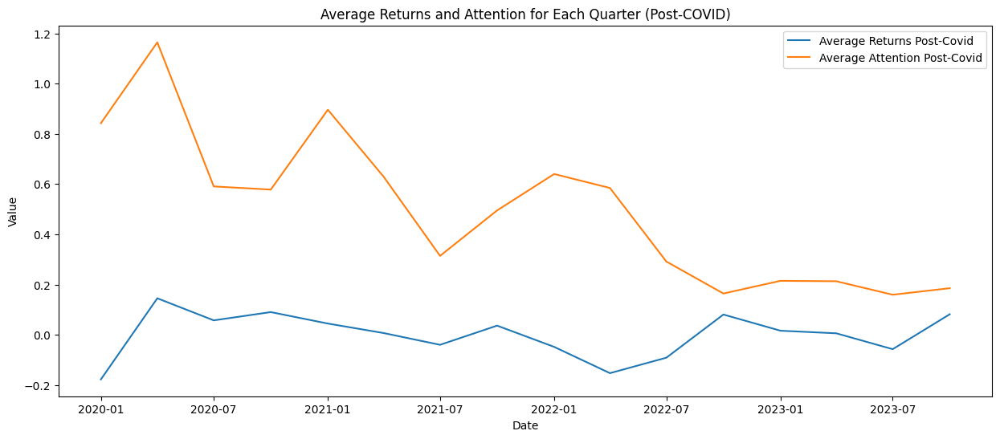

In [94]:
#Quarterly Visualizations 
average_returns_post_covid = quarterly_values[quarterly_values['Post-covid'] == 1].groupby('date')['quarterly_returns'].mean()
average_attention_post_covid = quarterly_values[quarterly_values['Post-covid'] == 1].groupby('date')['quarterly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns Post-Covid')
plt.plot(average_attention_post_covid.index, average_attention_post_covid, label='Average Attention Post-Covid')

plt.title('Average Returns and Attention for Each Quarter (Post-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

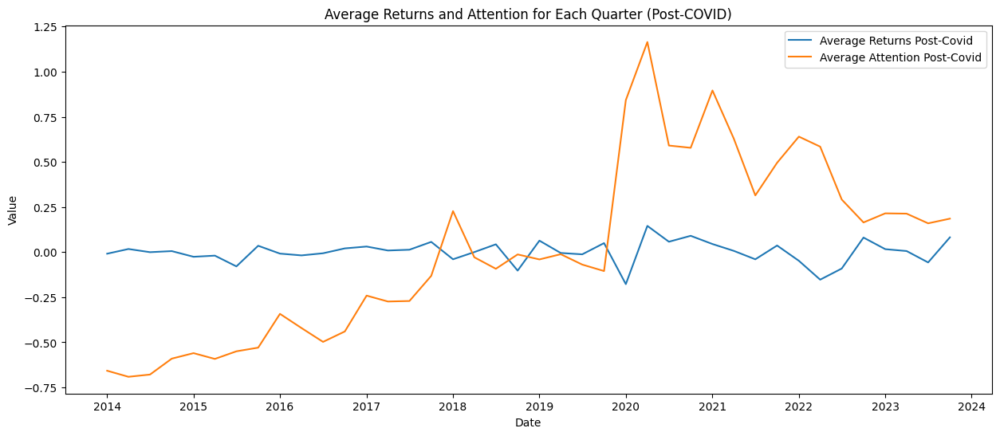

In [97]:
#Quarterly Visualizations 
average_q_returns = quarterly_values.groupby('date')['quarterly_returns'].mean()
average_q_attention = quarterly_values.groupby('date')['quarterly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_q_returns.index, average_q_returns, label='Average Returns Post-Covid')
plt.plot(average_q_attention.index, average_q_attention, label='Average Attention Post-Covid')

plt.title('Average Returns and Attention for Each Quarter (Post-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

In [99]:
#Monthly Look


monthly_values = pd.DataFrame()

monthly_values['monthly_returns']= temp.groupby(['ticker', 'industry'])['pct_return'].resample('MS').mean()
monthly_values['monthly_attention']= temp.groupby(['ticker', 'industry'])['name_price_attention'].resample('MS').mean()


monthly_values.tail(10)

monthly_returns  monthly_attention
ticker industry       date                                          
WMT    Consumer Goods 2023-03-01         0.068708           0.241441
                      2023-04-01         0.037348           0.300998
                      2023-05-01        -0.096038           0.178478
                      2023-06-01         0.152276           0.421805
                      2023-07-01         0.015046           0.267873
                      2023-08-01         0.018036           0.194847
                      2023-09-01        -0.081677           0.293204
                      2023-10-01         0.023112           0.338019
                      2023-11-01        -0.156474           0.181273
                      2023-12-01         0.013636           0.265535

In [100]:
monthly_values.reset_index(inplace=True)


split_date = '2020-01-01'


monthly_values['Post-covid'] = (monthly_values['date'] >= split_date).astype(int)
#quarterly_values['Post-covid'] = (quarterly_values['date']  >= split_date).astype(int)

monthly_values


,ticker,industry,date,monthly_returns,monthly_attention,Post-covid
0,AAPL,Technology,2014-01-01,-0.333184,-0.574129,0
1,AAPL,Technology,2014-02-01,0.137288,-0.453279,0
2,AAPL,Technology,2014-03-01,0.020089,-0.640997,0
3,AAPL,Technology,2014-04-01,0.236795,-0.712380,0
4,AAPL,Technology,2014-05-01,0.174454,-0.426228,0
...,...,...,...,...,...,...
3235,WMT,Consumer Goods,2023-08-01,0.018036,0.194847,1
3236,WMT,Consumer Goods,2023-09-01,-0.081677,0.293204,1
3237,WMT,Consumer Goods,2023-10-01,0.023112,0.338019,1
3238,WMT,Consumer Goods,2023-11-01,-0.156474,0.181273,1


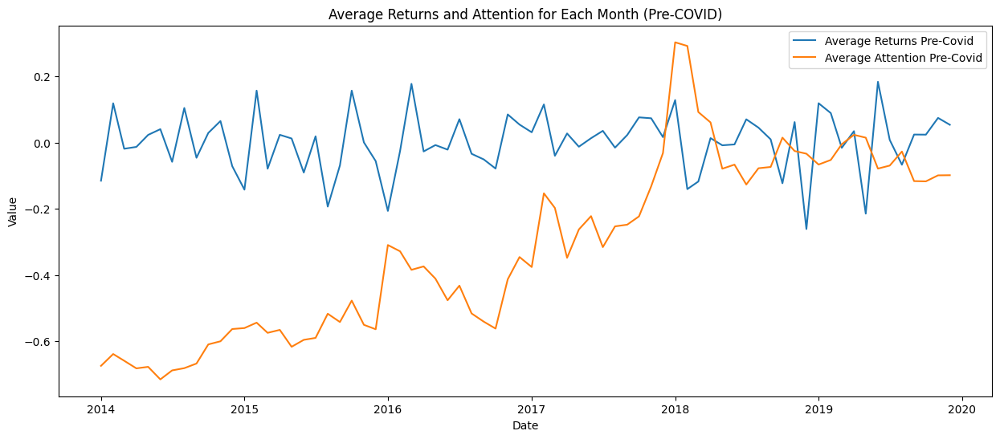

In [103]:
#Monthly Visualizations 
average_returns_pre_covid = monthly_values[monthly_values['Post-covid'] == 0].groupby('date')['monthly_returns'].mean()
average_attention_pre_covid = monthly_values[monthly_values['Post-covid'] == 0].groupby('date')['monthly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_pre_covid.index, average_returns_pre_covid, label='Average Returns Pre-Covid')
plt.plot(average_attention_pre_covid.index, average_attention_pre_covid, label='Average Attention Pre-Covid')

plt.title('Average Returns and Attention for Each Month (Pre-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


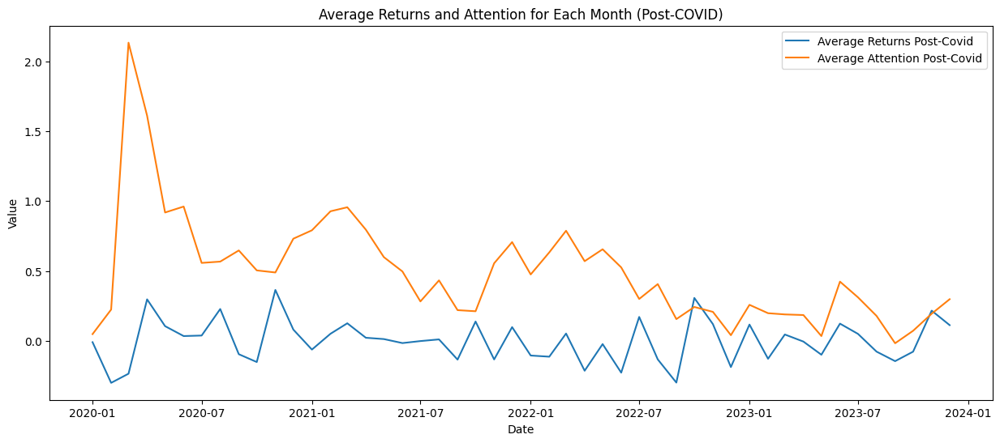

In [104]:
#Monthly Visualizations 
average_returns_post_covid = monthly_values[monthly_values['Post-covid'] == 1].groupby('date')['monthly_returns'].mean()
average_attention_post_covid = monthly_values[monthly_values['Post-covid'] == 1].groupby('date')['monthly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_returns_post_covid.index, average_returns_post_covid, label='Average Returns Post-Covid')
plt.plot(average_attention_post_covid.index, average_attention_post_covid, label='Average Attention Post-Covid')

plt.title('Average Returns and Attention for Each Month (Post-COVID)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


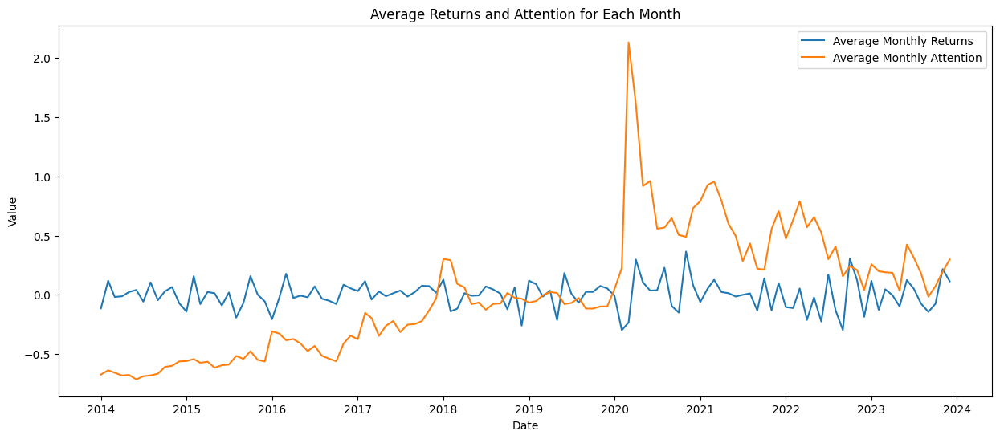

In [105]:
#Monthly Visualizations 
average_m_returns = monthly_values.groupby('date')['monthly_returns'].mean()
average_m_attention = monthly_values.groupby('date')['monthly_attention'].mean()
# Plotting
plt.figure(figsize=(15, 6))
plt.plot(average_m_returns.index, average_m_returns, label='Average Monthly Returns')
plt.plot(average_m_attention.index, average_m_attention, label='Average Monthly Attention')

plt.title('Average Returns and Attention for Each Month')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


### 2. Distributions of Independent Variables

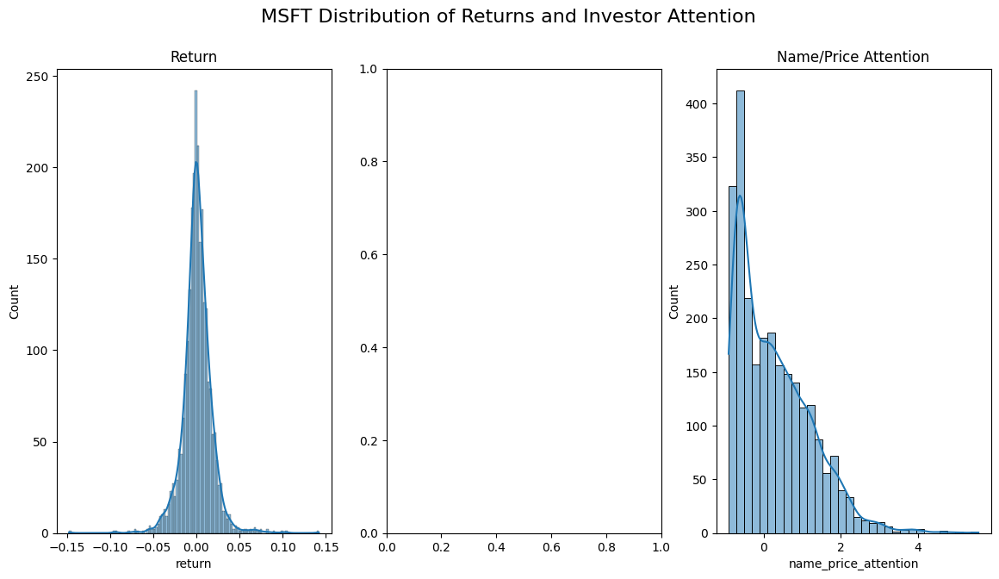

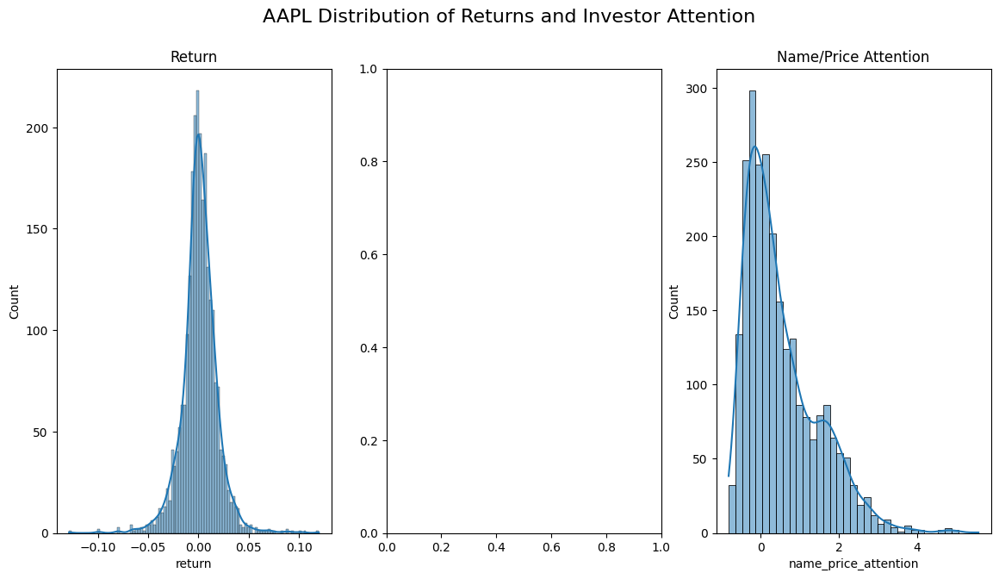

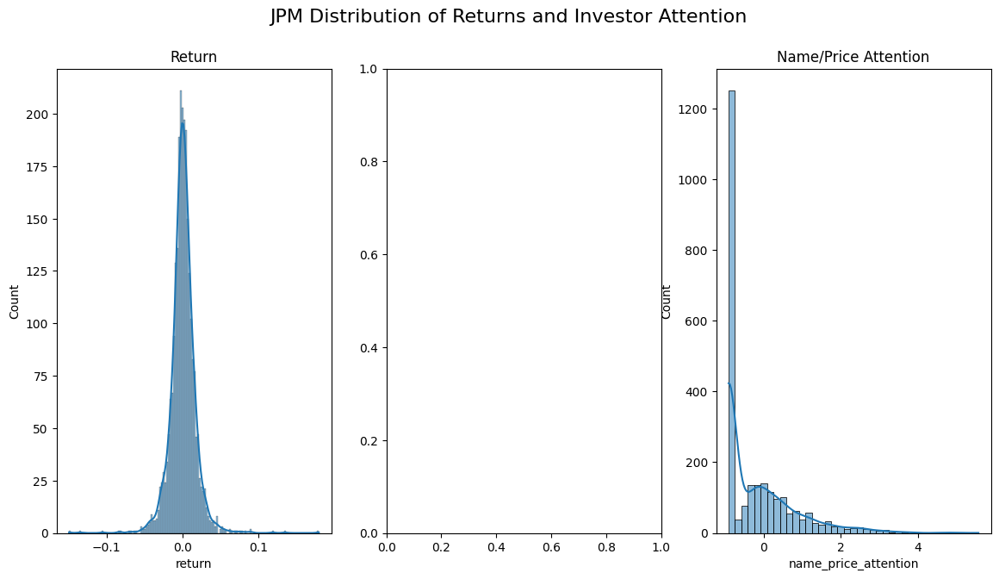

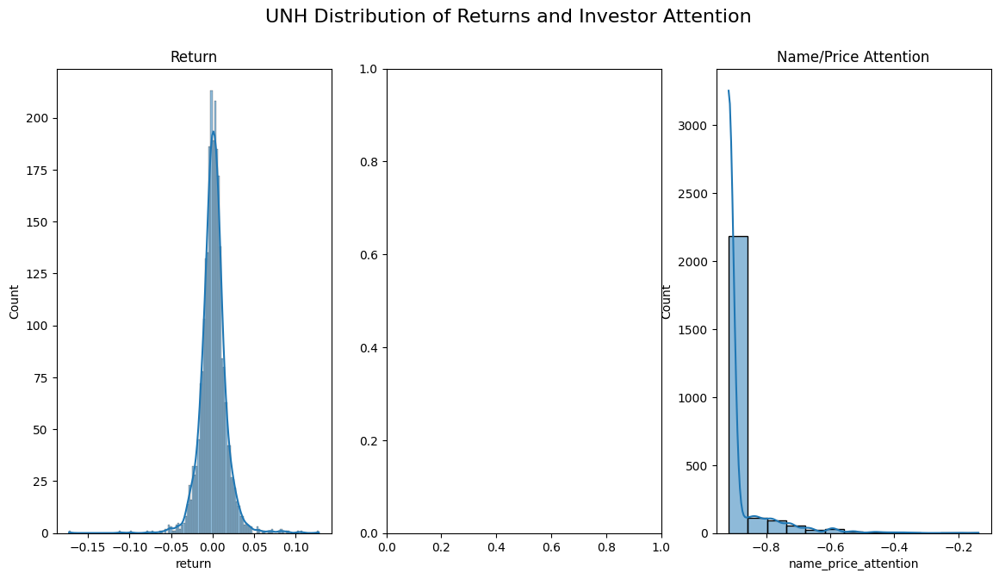

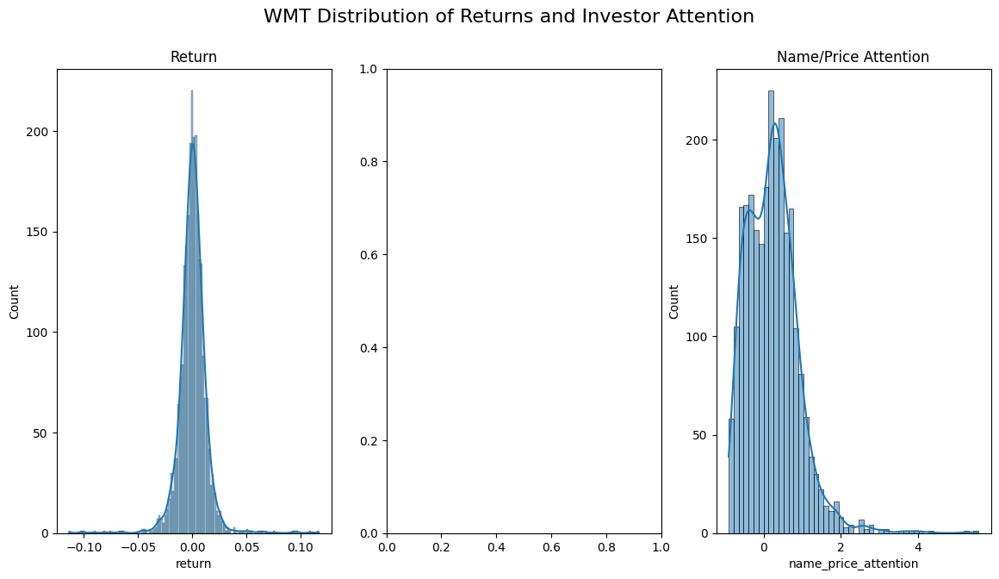

...

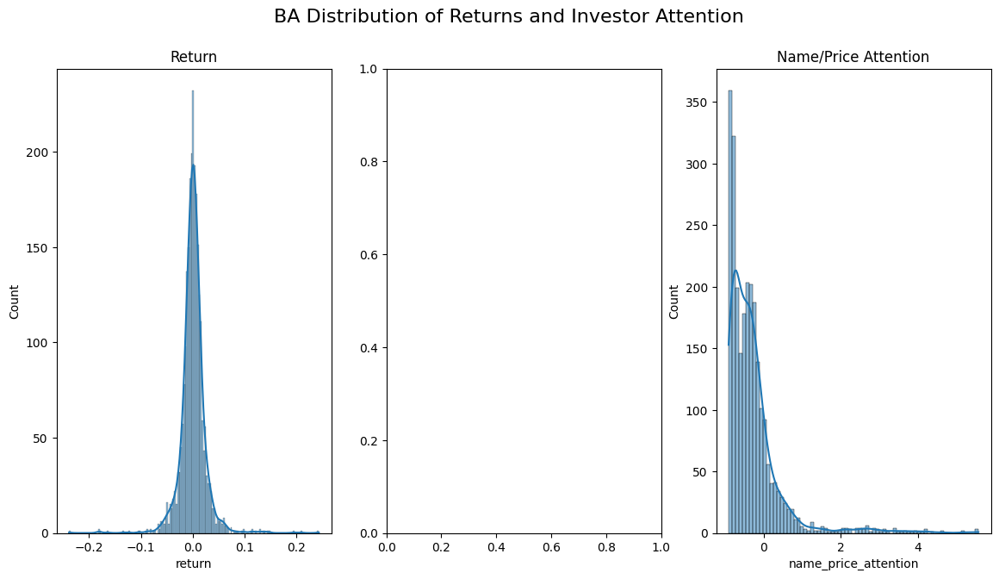

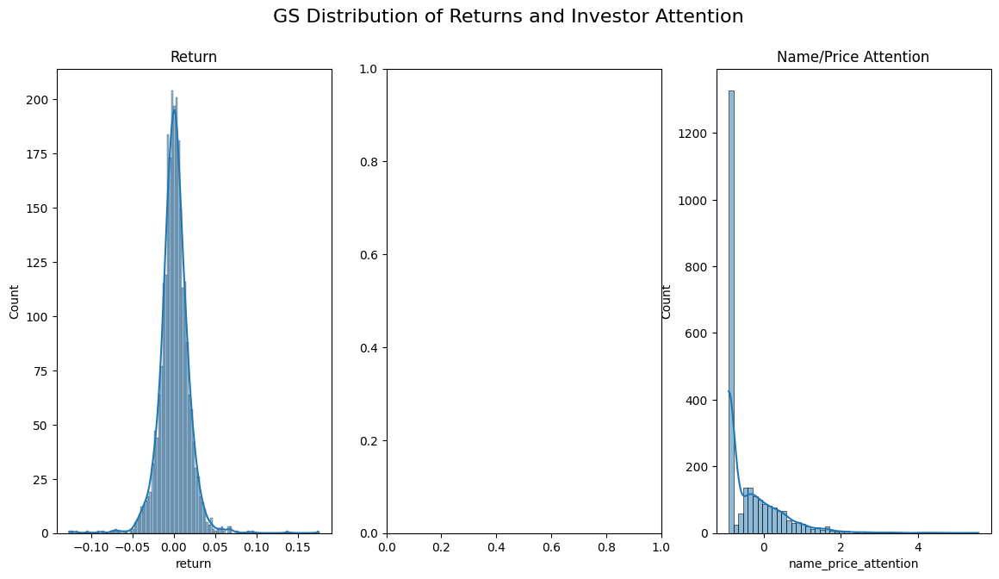

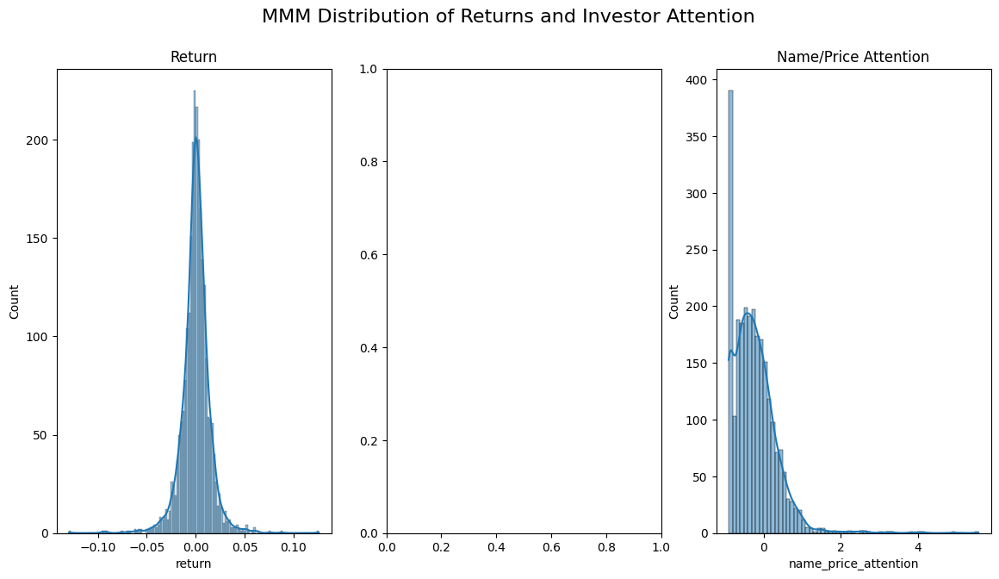

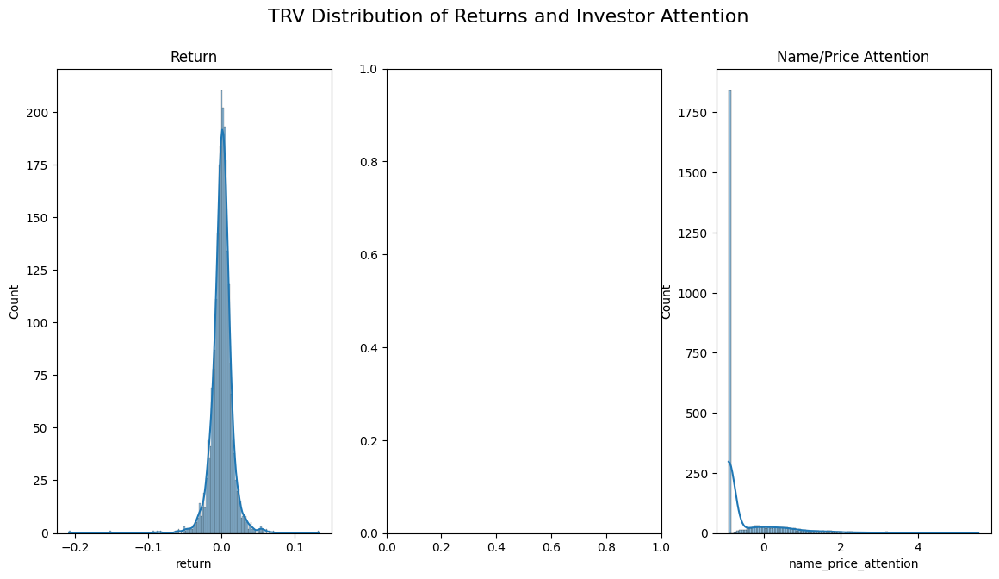

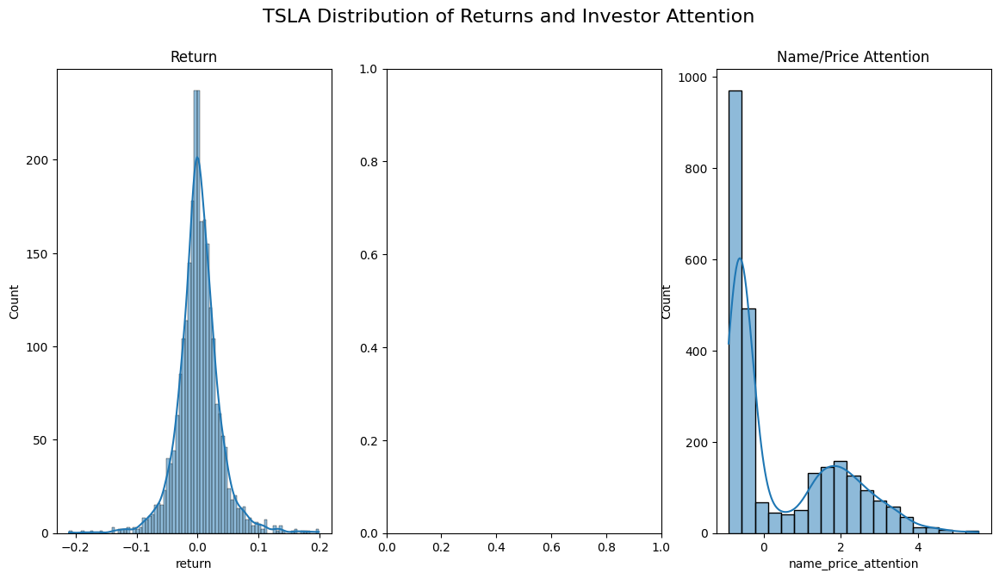

In [69]:
for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax = plt.subplots(1, 3, figsize=(14, 7))
    fig.suptitle(f'{stock} Distribution of Returns and Investor Attention', fontsize=16)
    sns.histplot(stock_data['return'], kde=True, ax=ax[0])
    ax[0].set_title('Return')
    sns.histplot(stock_data['name_price_attention'], kde=True, ax=ax[2])
    ax[2].set_title('Name/Price Attention')
    plt.show()



### 3. Scatter plots with the Relationships 

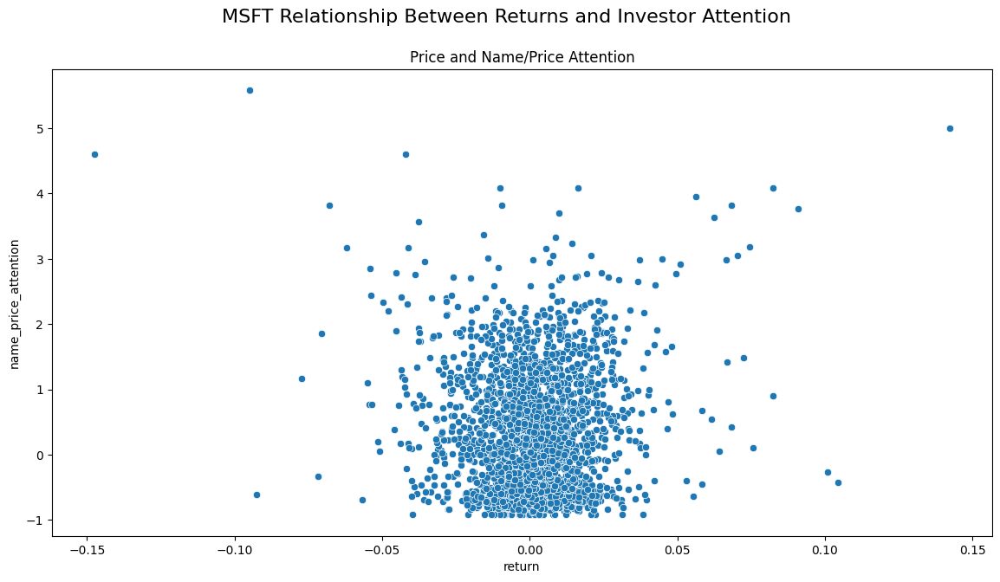

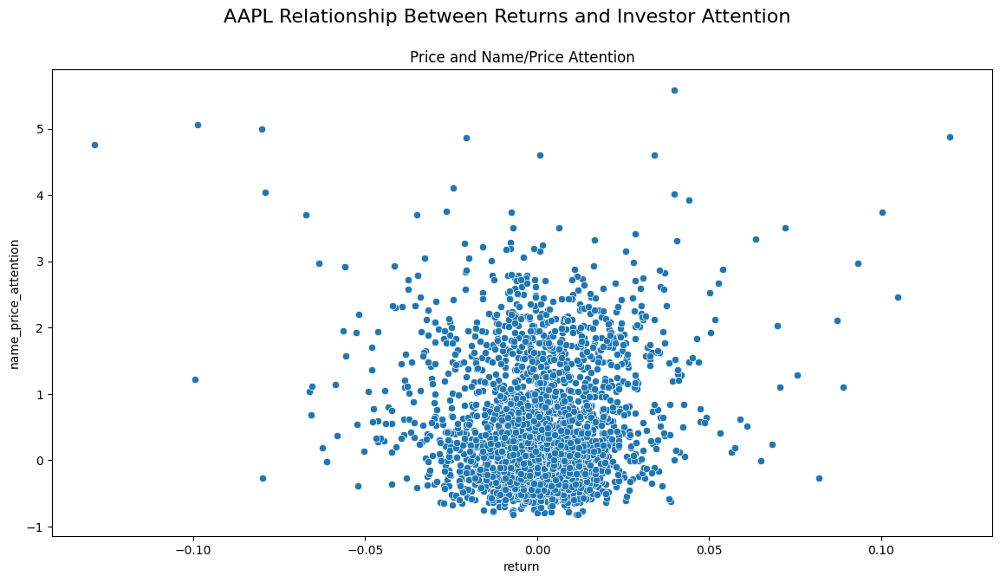

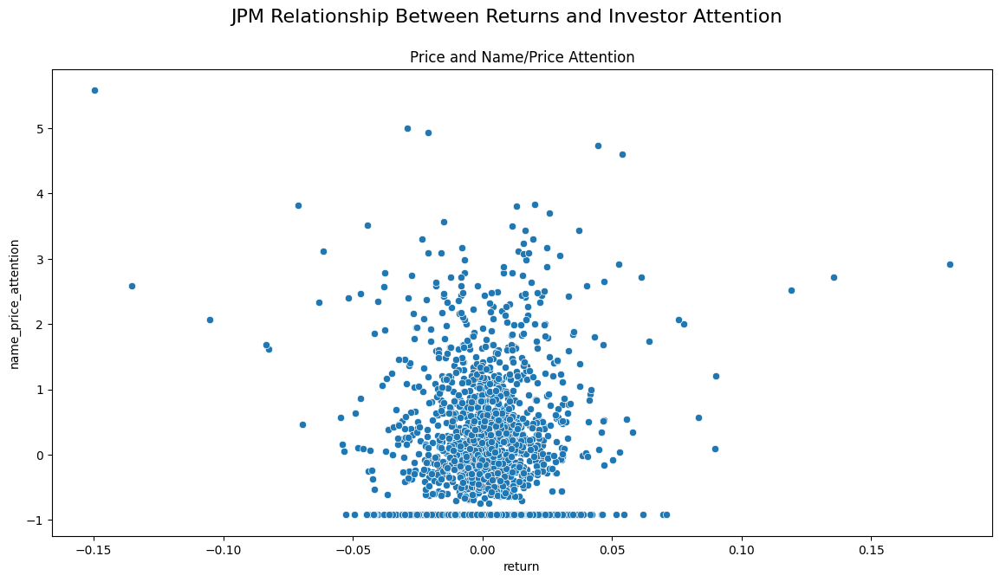

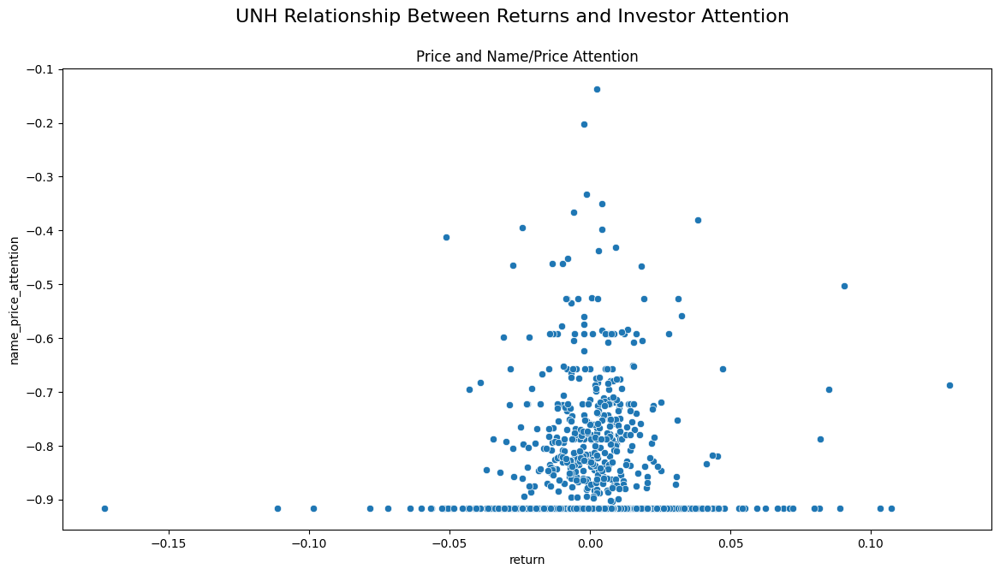

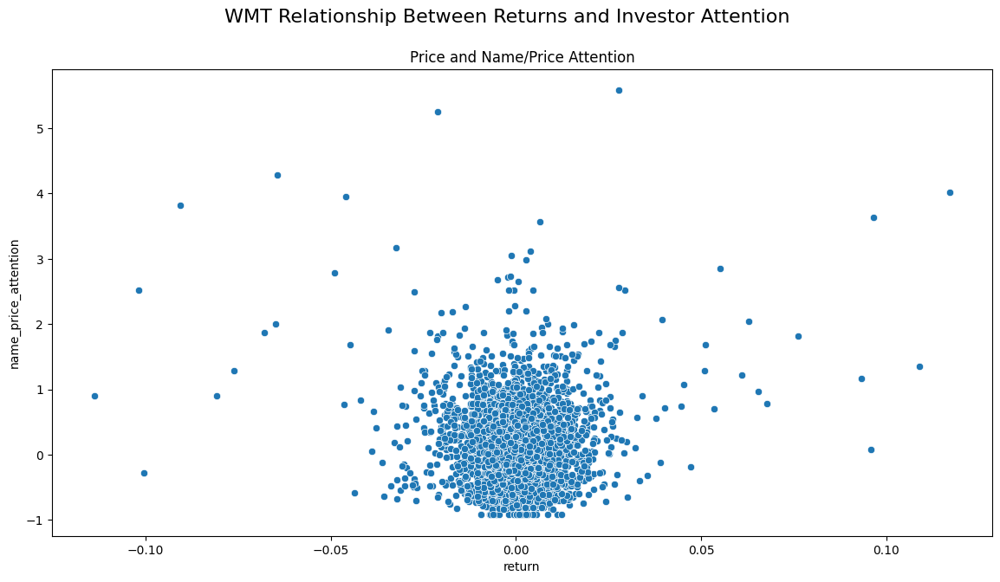

...

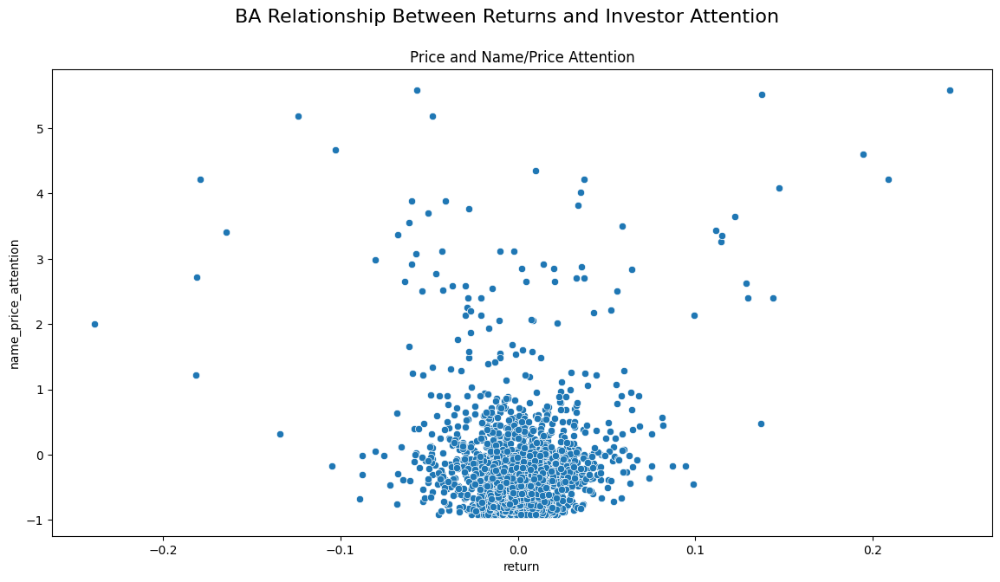

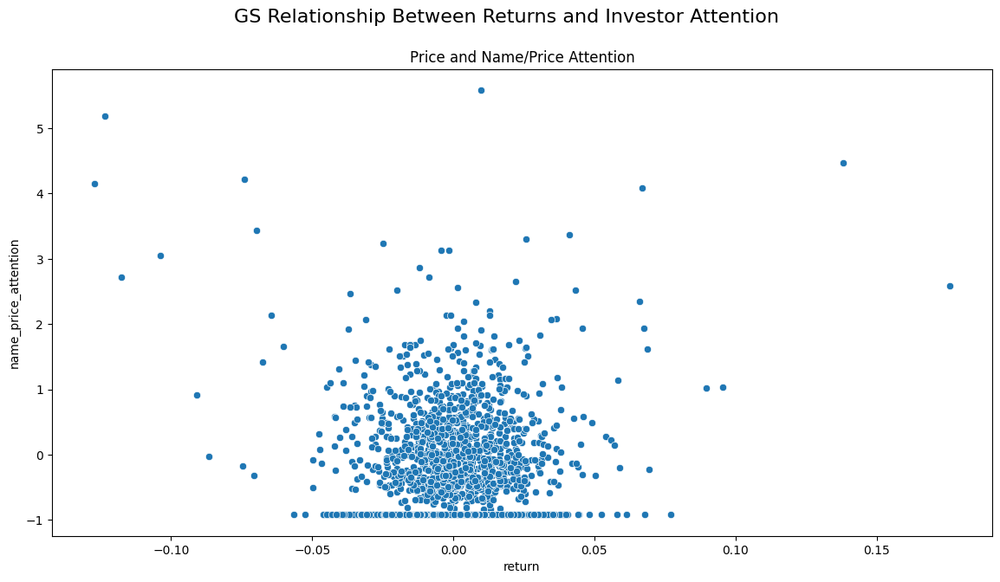

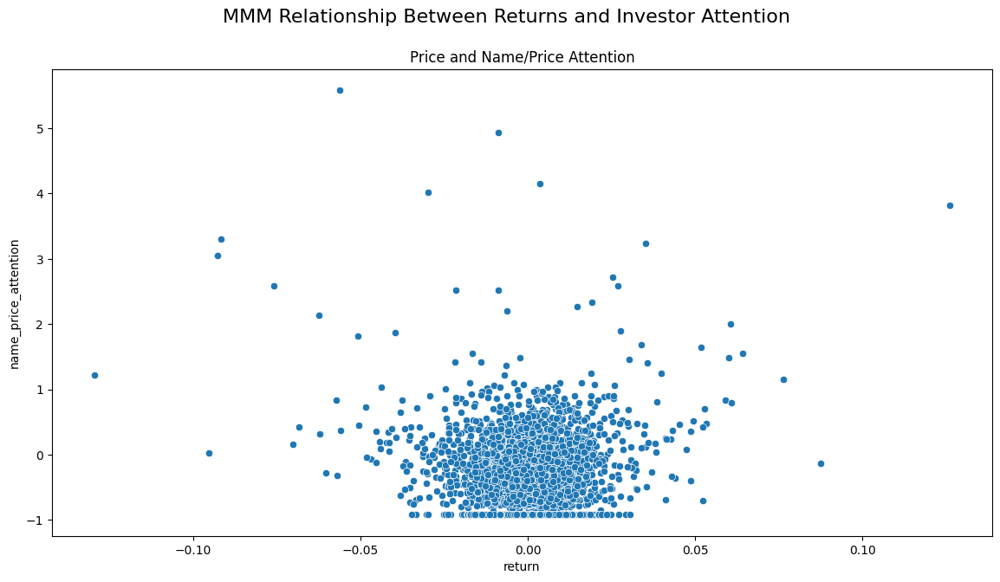

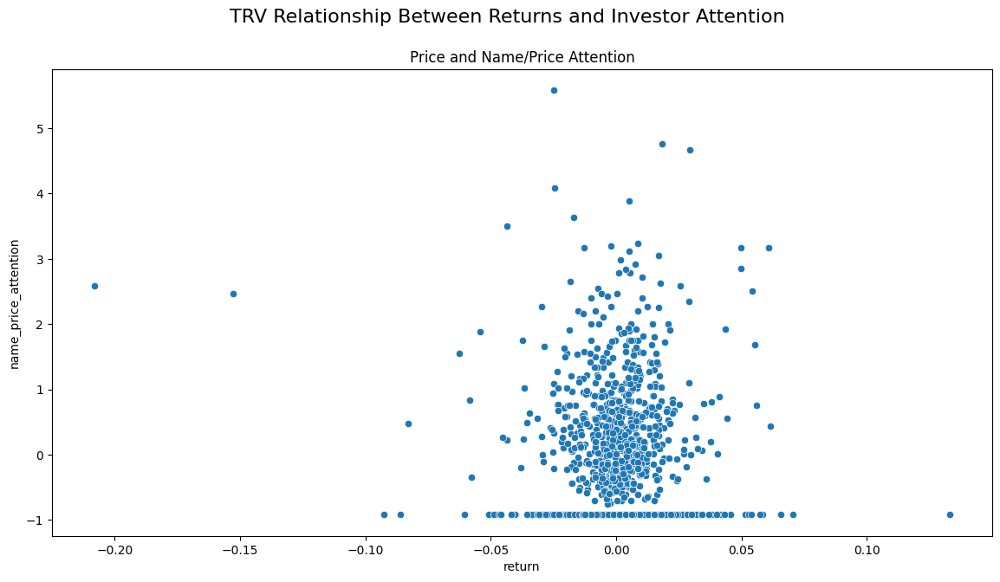

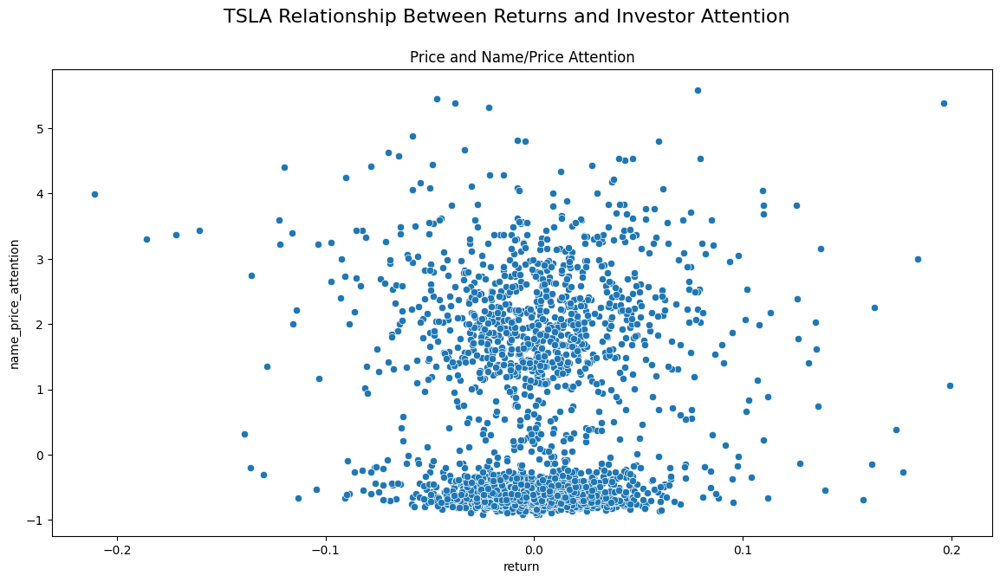

In [106]:
for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax = plt.subplots(1, figsize=(14, 7))
    fig.suptitle(f'{stock} Relationship Between Returns and Investor Attention', fontsize=16)
    sns.scatterplot(x=stock_data['return'], y=stock_data['name_price_attention'], ax=ax)
    ax.set_title('Price and Name/Price Attention')
    plt.show()